--- --- ---

# Laboratorio: Memorias asociativas con redes de Hopfield

## Objetivo

Construir una red de Hopfield capaz de almacenar imágenes binarias y recuperar una imagen original a partir de una versión con ruido.


# Actividades

Para las imágenes dadas, construya un algoritmo que permita recuperar la imagen original a partir de una imagen perturbada.

Debe implementar funciones para:

1. Convertir una imagen binaria en un vector de estados.
2. Calcular la matriz de pesos de Hopfield.
3. Calcular el campo local que siente una neurona.
4. Actualizar el estado de una neurona.
5. Calcular la energía total de la red.
6. Aplicar ruido a una imagen.
7. Recuperar la imagen mediante actualización asincrónica aleatoria.

---

# Modelo de Hopfield

La matriz de pesos se define mediante la regla de Hebb:

$$
w_{ij}=\frac{1}{N}\sum_{\mu=1}^{P}\xi_i^\mu \xi_j^\mu
$$

con:

$$
w_{ii}=0
$$

donde:

- $N$ es el número total de píxeles,
- $P$ es el número de patrones almacenados,
- $\xi^\mu$ es el patrón $\mu$-ésimo.

---

# Campo local

Para una neurona $i$, el campo local es:

$$
h_i=\sum_j w_{ij}s_j
$$

Este campo representa la influencia colectiva que todas las demás neuronas ejercen sobre la neurona $i$.

---

# Regla de actualización

La actualización determinista de Hopfield es:

$$
s_i \leftarrow \mathrm{sign}(h_i)
$$

Si:

$$
h_i>0
$$

entonces:

$$
s_i=1
$$

Si:

$$
h_i<0
$$

entonces:

$$
s_i=-1
$$

---

# Energía de la red

La energía total del sistema se define como:

$$
E(s)=-\frac{1}{2}\sum_{ij}w_{ij}s_is_j
$$

o equivalentemente:

$$
E(s)=-\frac{1}{2}s^TWs
$$

El proceso de recuperación debe tender a disminuir la energía.

---

# Algoritmo sugerido

Dada una imagen con ruido:

1. Seleccione aleatoriamente un píxel $i$.
2. Calcule el campo local:

$$
h_i=\sum_j w_{ij}s_j
$$

3. Actualice el estado del píxel:

$$
s_i \leftarrow \mathrm{sign}(h_i)
$$

4. Calcule la nueva energía del sistema:

$$
E(s)=-\frac{1}{2}s^TWs
$$

5. Visite otro píxel aleatoriamente.
6. Repita el proceso hasta que:
   - la imagen deje de cambiar,
   - la energía se estabilice,
   - o se alcance un número máximo de iteraciones.


# Comentario importante

La actualización debe ser preferiblemente **asincrónica y aleatoria**, porque cada vez que se actualiza un píxel, cambia el estado global de la red. Por tanto, el siguiente campo local debe calcularse usando la imagen ya actualizada.

---


---

# Capacidad de memoria

La capacidad aproximada de una red de Hopfield clásica es:

$$
P_c \approx 0.138N
$$

donde:

- $P_c$ es el número máximo de patrones recuperables,
- $N$ es el número total de neuronas.

Cuando el número de patrones almacenados supera este valor, aparecen errores y estados espurios.




In [52]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib import animation
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage import data
from skimage.transform import resize
from IPython.display import HTML

In [53]:
def patrones_balanceados(n, m):
    horizontal = -np.ones((n, m))
    horizontal[:n//2, :] = 1

    vertical = -np.ones((n, m))
    vertical[:, :m//2] = 1

    checker = np.indices((n, m)).sum(axis=0)
    checker = np.where(checker % 2 == 0, 1, -1)

    return horizontal, vertical, checker

def agregar_ruido(s, frac=0.25, seed=None):
    if seed is not None:
        np.random.seed(seed)

    s_ruido = s.copy()
    N = len(s)

    n_flip = int(frac * N)
    idx = np.random.choice(N, n_flip, replace=False)

    s_ruido[idx] *= -1

    return s_ruido

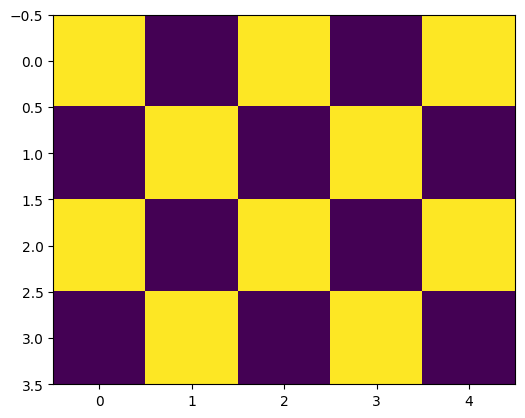

In [54]:
m=5
n=4
N=n*m
h, v, d = patrones_balanceados(n, m)
plt.imshow(d)


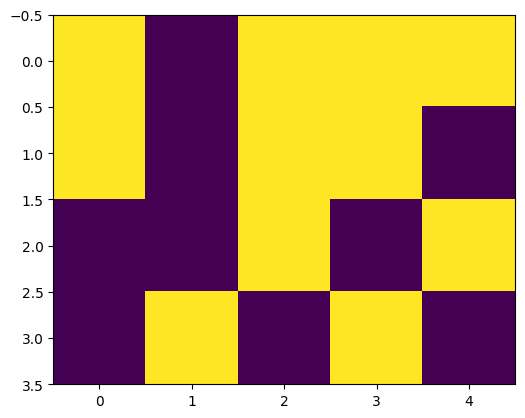

In [55]:
s_ruido = agregar_ruido(np.concat(d), frac=0.25, seed=10)
plt.imshow(np.reshape(s_ruido, (n, m)))

--- --- ---
Solucion


In [56]:
import numpy as np

def calcular_pesos_hopfield(patrones, normalizar=True):
    """
    patrones: array (P, N), valores en {-1, +1}
    """
    patrones = np.asarray(patrones)
    P, N = patrones.shape

    # Regla de Hebb: W = sum_mu xi^mu (xi^mu)^T
    W = patrones.T @ patrones

    # Sin autoconexiones
    np.fill_diagonal(W, 0)

    # Escalado común (opcional pero recomendado)
    if normalizar:
        W = W / N

    return W

def energia_hopfield(s, W):
    return -0.5 * s @ W @ s

def agregar_ruido_flip_bits(s, p=0.2, rng=None):
    """
    Voltea cada bit con probabilidad p.
    """
    if rng is None:
        rng = np.random.default_rng()
    s_ruidoso = s.copy()
    mask = rng.random(s.shape) < p
    s_ruidoso[mask] *= -1
    return s_ruidoso

def recuperar_hopfield(s0, W, max_iters=50, modo="asincrono", rng=None):
    """
    Recupera patrón por dinámica Hopfield.
    modo: 'asincrono' (recomendado) o 'sincrono'
    """
    if rng is None:
        rng = np.random.default_rng()

    s = s0.copy()
    N = s.size
    energias = [energia_hopfield(s, W)]

    for _ in range(max_iters):
        s_prev = s.copy()

        if modo == "asincrono":
            # Actualiza neurona por neurona en orden aleatorio
            for i in rng.permutation(N):
                h_i = W[i] @ s
                s[i] = 1 if h_i >= 0 else -1
        else:
            # Actualización en bloque
            h = W @ s
            s = np.where(h >= 0, 1, -1)

        energias.append(energia_hopfield(s, W))

        # Criterio de convergencia
        if np.array_equal(s, s_prev):
            break

    return s, np.array(energias)

def overlap(s, patron):
    # Solapamiento en [-1,1], 1 significa idéntico
    return (s @ patron) / s.size

# Asegura que estén en {-1, +1}
psi = np.array([
    h.flatten(),
    v.flatten(),
    d.flatten()
], dtype=int)

# Si venían como 0/1, conviértelos:
# psi = np.where(psi > 0, 1, -1)

W = calcular_pesos_hopfield(psi, normalizar=True)

# Energías de los patrones memorizados
Eh = energia_hopfield(psi[0], W)
Ev = energia_hopfield(psi[1], W)
Ed = energia_hopfield(psi[2], W)
print("Energías:", Eh, Ev, Ed)

# Ejemplo: contaminar h y recuperar
rng = np.random.default_rng(123)
s_noisy = agregar_ruido_flip_bits(psi[0], p=0.25, rng=rng)
s_rec, Etraj = recuperar_hopfield(s_noisy, W, max_iters=50, modo="asincrono", rng=rng)

print("Overlap con h:", overlap(s_rec, psi[0]))
print("Overlap con v:", overlap(s_rec, psi[1]))
print("Overlap con d:", overlap(s_rec, psi[2]))
print("Patrón recuperado:", np.argmax([overlap(s_rec, p) for p in psi]))

Energías: -8.500000000000002 -8.500000000000002 -8.500000000000002
Overlap con h: 0.0
Overlap con v: 0.0
Overlap con d: -1.0
Patrón recuperado: 0


--- ---


In [57]:
# @title
def recuperar_hopfield_con_historial(s0, W, shape_2d, max_iters=20, seed=None):
    rng = np.random.default_rng(seed)
    s = s0.copy().astype(int)
    N = s.size

    historial = [s.reshape(shape_2d).copy()]
    energias = [energia_hopfield(s, W)]
    cambios = [0]

    for _ in range(max_iters):
        s_prev = s.copy()

        # Actualización asíncrona en orden aleatorio
        for i in rng.permutation(N):
            h_i = W[i] @ s
            if h_i > 0:
                s[i] = 1
            elif h_i < 0:
                s[i] = -1
            # si h_i == 0, mantiene el estado actual (evita sesgo)

        delta = int(np.sum(s != s_prev))
        if delta == 0:
            break

        historial.append(s.reshape(shape_2d).copy())
        energias.append(energia_hopfield(s, W))
        cambios.append(delta)

    return s, historial, energias, cambios

def recuperar_con_historial_fino(s0, W, shape_2d, max_epocas=10, seed=0):
    rng = np.random.default_rng(seed)
    s = s0.copy().astype(int)
    N = s.size

    historial = [s.reshape(shape_2d).copy()]
    energias = [-0.5 * s @ W @ s]
    cambios_epoca = []

    for _ in range(max_epocas):
        cambios = 0
        for i in rng.permutation(N):
            h_i = W[i] @ s
            s_old = s[i]

            if h_i > 0:
                s[i] = 1
            elif h_i < 0:
                s[i] = -1
            # si h_i == 0, conserva s[i]

            if s[i] != s_old:
                cambios += 1
                # Guardar SOLO cuando realmente cambia algo
                historial.append(s.reshape(shape_2d).copy())
                energias.append(-0.5 * s @ W @ s)

        cambios_epoca.append(cambios)
        if cambios == 0:
            break

    return s, historial, energias, cambios_epoca

In [58]:
# @title
def mostrar_historial(historial, energias=None, cambios=None, cols=6):
    T = len(historial)
    rows = int(np.ceil(T / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(2.2*cols, 2.2*rows))
    axes = np.array(axes).reshape(rows, cols)

    for t in range(rows * cols):
        ax = axes[t // cols, t % cols]
        ax.axis("off")
        if t < T:
            ax.imshow((historial[t] + 1)/2, cmap="gray", vmin=0, vmax=1)
            txt = f"it {t}"
            if energias is not None:
                txt += f"\nE={energias[t]:.3f}"
            if cambios is not None and t > 0:
                txt += f"\nΔ={cambios[t]}"
            ax.set_title(txt, fontsize=8)

    plt.tight_layout()
    plt.show()

def animar_historial(historial, energias=None, cambios=None, interval=500):
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.axis("off")
    im = ax.imshow((historial[0] + 1)/2, cmap="gray", vmin=0, vmax=1)
    title = ax.set_title("it 0")

    def update(t):
        im.set_data((historial[t] + 1)/2)
        txt = f"it {t}"
        if energias is not None:
            txt += f" | E={energias[t]:.3f}"
        if cambios is not None and t > 0:
            txt += f" | Δ={cambios[t]}"
        title.set_text(txt)
        return [im, title]

    ani = animation.FuncAnimation(
        fig, update, frames=len(historial), interval=interval, blit=False, repeat=True
    )
    plt.close(fig)
    return HTML(ani.to_jshtml())

In [59]:
n, m = 15, 15
N = n * m

h, v, d = patrones_balanceados(n, m)

psi = np.array([
    h.flatten(),
    v.flatten(),
    d.flatten()
], dtype=int)

W = calcular_pesos_hopfield(psi, normalizar=True)

Eh = energia_hopfield(psi[0], W)
Ev = energia_hopfield(psi[1], W)
Ed = energia_hopfield(psi[2], W)
print("Energías:", Eh, Ev, Ed)

Energías: -111.00444444444442 -111.00444444444445 -111.00444444444443


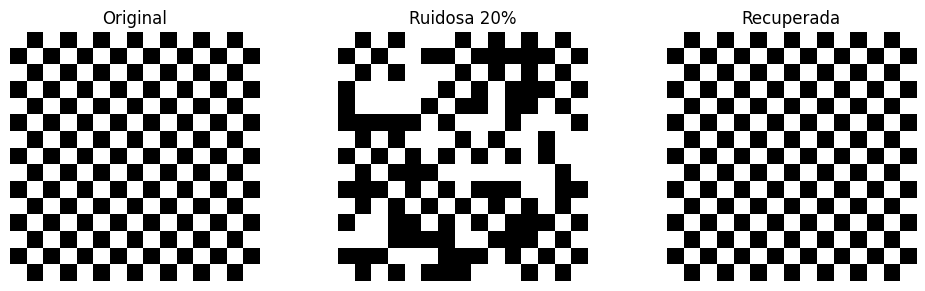

In [60]:
objetivo = d.flatten()  # prueba con patrón ajedrez
frac_ruido = 0.20
s_ruido = agregar_ruido(objetivo, frac=frac_ruido, seed=10)

s_final, historial, energias, cambios = recuperar_hopfield_con_historial(
    s_ruido, W, shape_2d=(n, m), max_iters=25, seed=10
)

fig, ax = plt.subplots(1, 3, figsize=(10, 3))
ax[0].imshow((d + 1)/2, cmap="gray", vmin=0, vmax=1)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow((s_ruido.reshape(n, m) + 1)/2, cmap="gray", vmin=0, vmax=1)
ax[1].set_title(f"Ruidosa {frac_ruido*100:.0f}%")
ax[1].axis("off")

ax[2].imshow((s_final.reshape(n, m) + 1)/2, cmap="gray", vmin=0, vmax=1)
ax[2].set_title("Recuperada")
ax[2].axis("off")

plt.tight_layout()
plt.show()

In [61]:
# @title
n, m = h.shape
psi = np.array([h.flatten(), v.flatten(), d.flatten()], dtype=int)
W = calcular_pesos_hopfield(psi)

objetivo = d.flatten()
s_ruido = agregar_ruido(objetivo, frac=0.25, seed=10)

s_final, historial, energias, cambios_epoca = recuperar_con_historial_fino(
    s_ruido, W, shape_2d=(n, m), max_epocas=10, seed=10
)

print("cambios por época:", cambios_epoca)
print("n_frames:", len(historial))

cambios por época: [56, 0]
n_frames: 57


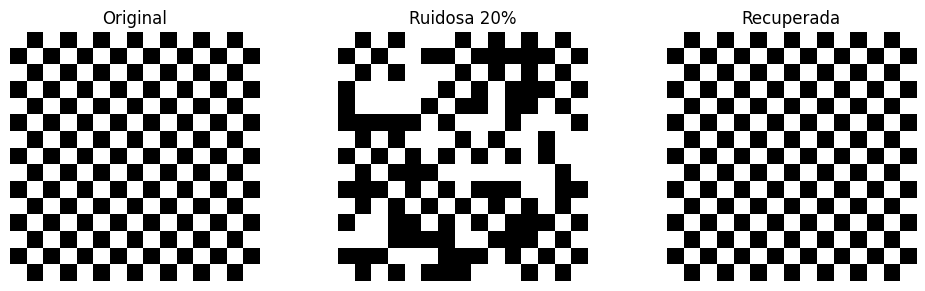

In [62]:
# @title
objetivo = d.flatten()  # prueba con patrón ajedrez
frac_ruido = 0.20
s_ruido = agregar_ruido(objetivo, frac=frac_ruido, seed=10)

s_final, historial, energias, cambios = recuperar_hopfield_con_historial(
    s_ruido, W, shape_2d=(n, m), max_iters=25, seed=10
)

fig, ax = plt.subplots(1, 3, figsize=(10, 3))
ax[0].imshow((d + 1)/2, cmap="gray", vmin=0, vmax=1)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow((s_ruido.reshape(n, m) + 1)/2, cmap="gray", vmin=0, vmax=1)
ax[1].set_title(f"Ruidosa {frac_ruido*100:.0f}%")
ax[1].axis("off")

ax[2].imshow((s_final.reshape(n, m) + 1)/2, cmap="gray", vmin=0, vmax=1)
ax[2].set_title("Recuperada")
ax[2].axis("off")

plt.tight_layout()
plt.show()

--- --- ---

Visualizacion de la actualizacion asincronica

In [63]:
# @title
def recuperar_neurona_a_neurona(s0, W, shape_2d, max_epocas=10, seed=0, guardar_sin_cambio=True):
    rng = np.random.default_rng(seed)
    s = s0.copy().astype(int)
    N = s.size
    n, m = shape_2d

    frames = [s.reshape(shape_2d).copy()]
    info = [{
        "epoca": 0, "paso": 0, "i": None, "cambio": None,
        "energia": -0.5 * s @ W @ s
    }]

    for ep in range(1, max_epocas + 1):
        cambios_epoca = 0
        orden = rng.permutation(N)

        for paso, i in enumerate(orden, start=1):
            viejo = s[i]
            h_i = W[i] @ s

            if h_i > 0:
                s[i] = 1
            elif h_i < 0:
                s[i] = -1
            # empate -> conserva estado

            cambio = int(s[i] != viejo)
            cambios_epoca += cambio

            if guardar_sin_cambio or cambio:
                frames.append(s.reshape(shape_2d).copy())
                info.append({
                    "epoca": ep,
                    "paso": paso,
                    "i": int(i),
                    "cambio": int(cambio),
                    "energia": float(-0.5 * s @ W @ s)
                })

        if cambios_epoca == 0:
            break

    return s, frames, info

In [64]:
def animar_neurona_a_neurona(frames, info, shape_2d, interval=120):
    n, m = shape_2d
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.axis("off")

    im = ax.imshow((frames[0] + 1) / 2, cmap="gray", vmin=0, vmax=1)
    marker = ax.scatter([], [], s=80, facecolors="none", edgecolors="red", linewidths=2)

    txt = ax.set_title("Estado inicial")

    def update(k):
        im.set_data((frames[k] + 1) / 2)

        i = info[k]["i"]
        if i is None:
            marker.set_offsets(np.empty((0, 2)))
            txt.set_text(f"inicio | E={info[k]['energia']:.3f}")
        else:
            r, c = divmod(i, m)
            marker.set_offsets(np.array([[c, r]]))
            color = "lime" if info[k]["cambio"] == 1 else "red"
            marker.set_edgecolors(color)
            txt.set_text(
                f"ep={info[k]['epoca']} paso={info[k]['paso']} i={i} "
                f"cambio={info[k]['cambio']} E={info[k]['energia']:.3f}"
            )
        return [im, marker, txt]

    ani = animation.FuncAnimation(fig, update, frames=len(frames), interval=interval, blit=False, repeat=True)
    plt.close(fig)
    return HTML(ani.to_jshtml())

In [65]:

n, m = 15, 15
h, v, d = patrones_balanceados(n, m)
psi = np.array([h.flatten(), v.flatten(), d.flatten()], dtype=int)
W = calcular_pesos_hopfield(psi)

s_obj = d.flatten()
s_ruido = agregar_ruido(s_obj, frac=0.25, seed=10)

s_fin, frames, info = recuperar_neurona_a_neurona(
    s_ruido, W, shape_2d=(n, m), max_epocas=8, seed=10,
    guardar_sin_cambio=True   # True = muestra todas las neuronas visitadas
)

print("frames totales:", len(frames))
animar_neurona_a_neurona(frames, info, shape_2d=(n, m), interval=100)

frames totales: 451


In [66]:
# @title
def recuperar_neurona_a_neurona(s0, W, shape_2d, max_epocas=5, seed=0, guardar_sin_cambio=True):
    rng = np.random.default_rng(seed)
    s = s0.copy().astype(int)
    N = s.size

    energia_actual = float(-0.5 * s @ W @ s)

    frames = [s.reshape(shape_2d).copy()]
    info = [{
        "epoca": 0, "paso": 0, "i": None, "cambio": None,
        "energia": energia_actual
    }]

    # NUEVO: Contador de visitas consecutivas sin registrar cambios
    pasos_sin_cambio = 0
    ya_convergido = False

    for ep in range(1, max_epocas + 1):
        orden = rng.permutation(N)

        for paso, i in enumerate(orden, start=1):
            viejo = s[i]
            h_i = W[i] @ s

            if h_i > 0:
                s[i] = 1
            elif h_i < 0:
                s[i] = -1

            if s[i] != viejo:
                cambio = 1
                delta_s = s[i] - viejo
                energia_actual -= float(delta_s * h_i)
                pasos_sin_cambio = 0 # Se reinicia el contador porque hubo actividad
            else:
                cambio = 0
                pasos_sin_cambio += 1 # Registramos una neurona conforme con su estado

            if guardar_sin_cambio or cambio:
                frames.append(s.reshape(shape_2d).copy())
                info.append({
                    "epoca": ep,
                    "paso": paso,
                    "i": int(i),
                    "cambio": cambio,
                    "energia": energia_actual
                })

            # NUEVO: Si ya revisamos N neuronas seguidas y ninguna cambió,
            # el sistema alcanzó la estabilidad absoluta. Frenamos de inmediato.
            if pasos_sin_cambio >= N:
                ya_convergido = True
                break

        if ya_convergido:
            break

    return s, frames, info

In [67]:
# @title
def animar_neurona_a_neurona(frames, info, shape_2d, interval=120):
    n, m = shape_2d
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.axis("off")

    # Mapeo previo vectorizado de los frames
    frames_norm = [(f + 1) // 2 for f in frames]
    im = ax.imshow(frames_norm[0], cmap="gray", vmin=0, vmax=1)

    marker = ax.scatter([], [], s=80, facecolors="none", edgecolors="red", linewidths=2)
    txt = ax.set_title("Estado inicial")

    def update(k):
        im.set_data(frames_norm[k])

        i = info[k]["i"]
        if i is None:
            marker.set_offsets(np.empty((0, 2)))
            txt.set_text(f"inicio | E={info[k]['energia']:.3f}")
        else:
            r, c = divmod(i, m)
            marker.set_offsets([[c, r]])

            color = "lime" if info[k]["cambio"] == 1 else "red"
            marker.set_edgecolors(color)

            txt.set_text(
                f"ep={info[k]['epoca']} paso={info[k]['paso']} i={i} "
                f"cambio={info[k]['cambio']} E={info[k]['energia']:.3f}"
            )

        return im, marker, txt

    ani = animation.FuncAnimation(
        fig, update, frames=len(frames), interval=interval, blit=True, repeat=True
    )

    plt.close(fig)
    return HTML(ani.to_jshtml())

Simulación finalizada. Cuadros totales generados: 194



[INFO] La energía dejó de cambiar permanentemente en el paso: 93


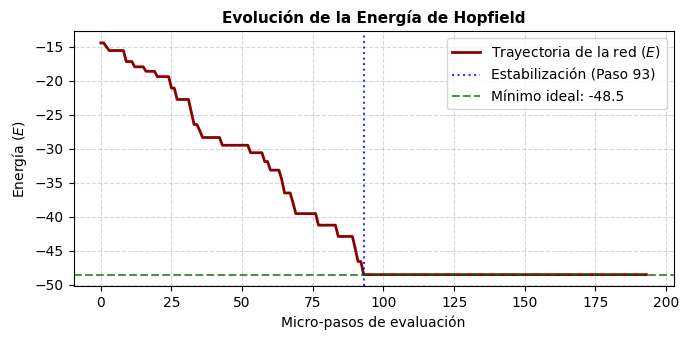

In [68]:
# --- 3. CONFIGURACIÓN DEL EXPERIMENTO, ANIMACIÓN Y ANÁLISIS DE ENERGÍA ---

# Parámetros del espacio de espines
n, m = 10, 10
shape_2d = (n, m)

# Generación de patrones fundamentales
h, v, d = patrones_balanceados(n, m)

# Construcción de la matriz de almacenamiento (P, N)
psi = np.array([h.flatten(), v.flatten(), d.flatten()], dtype=np.int8)

# Cálculo eficiente de la matriz de conectividad de Hebb
W = calcular_pesos_hopfield(psi)

# Definimos el patrón objetivo (Tablero de ajedrez) y le inyectamos ruido
s_obj = d.flatten()
s_ruido = agregar_ruido(s_obj, frac=0.25, seed=10)

# Ejecución de la dinámica asincrónica con actualización incremental de energía
s_fin, frames, info = recuperar_neurona_a_reconocer = recuperar_neurona_a_neurona(
    s_ruido, W, shape_2d=shape_2d, max_epocas=8, seed=10,
    guardar_sin_cambio=True   # True = traza cada neurona visitada, cambie o no
)

print(f"Simulación finalizada. Cuadros totales generados: {len(frames)}")

# 1. Renderizado de la Animación
animacion_html = animar_neurona_a_neurona(frames, info, shape_2d=shape_2d, interval=100)
display(animacion_html)

# --- 2. ANÁLISIS DE ESTABILIZACIÓN ---
energias_pasos = [inf['energia'] for inf in info]
diferencias_energia = np.diff(energias_pasos)
indices_con_cambio = np.where(diferencias_energia != 0)[0]

paso_estabilizacion = indices_con_cambio[-1] + 1 if len(indices_con_cambio) > 0 else 0
print(f"\n[INFO] La energía dejó de cambiar permanentemente en el paso: {paso_estabilizacion}")

# --- 3. GRÁFICA DE ENERGÍA ---
fig_e, ax_e = plt.subplots(figsize=(7, 3.5))
ax_e.plot(energias_pasos, color='darkred', lw=2, label='Trayectoria de la red ($E$)')

# Línea vertical en el punto exacto de estabilización
if paso_estabilizacion > 0:
    ax_e.axvline(x=paso_estabilizacion, color='blue', linestyle=':', alpha=0.8,
                 label=f'Estabilización (Paso {paso_estabilizacion})')

energia_ideal = float(-0.5 * s_obj @ W @ s_obj)
ax_e.axhline(y=energia_ideal, color='darkgreen', linestyle='--', alpha=0.7,
             label=f'Mínimo ideal: {energia_ideal:.1f}')

ax_e.set_title("Evolución de la Energía de Hopfield", fontsize=11, fontweight='bold')
ax_e.set_xlabel("Micro-pasos de evaluación")
ax_e.set_ylabel("Energía ($E$)")
ax_e.grid(True, linestyle='--', alpha=0.5)
ax_e.legend(loc='upper right')

plt.tight_layout()
plt.show()

In [68]:
# ============================================================
# 1. PREPARACIÓN DE LA IMAGEN PROPIA (PROCESAMIENTO)
# ============================================================

# Definimos un tamaño óptimo para la red de Hopfield
n, m = 64, 64
shape_2d = (n, m)

# Cargar la imagen original de skimage (512x512)
img_original = data.camera()

# Redimensionar a 64x64 antes de binarizar para proteger la memoria RAM
img_pequena = resize(img_original, shape_2d, anti_aliasing=True)

# Binarizar usando el promedio como umbral
threshold = img_pequena.mean()
img_bin = np.where(img_pequena > threshold, 1, -1)

# El patrón objetivo puro para almacenar en la memoria de la red
s_obj = img_bin.flatten()

# Generar la versión con 30% de ruido que intentaremos recuperar
frac_ruido = 0.30
s_ruido = agregar_ruido(s_obj, frac=frac_ruido, seed=123)


# ============================================================
# 2. ENTRENAMIENTO DE LA RED DE HOPFIELD
# ============================================================

# Convertimos nuestro patrón en una matriz de almacenamiento de forma (P, N)
# En este caso P = 1 (solo estamos guardando la imagen del fotógrafo)
psi = np.array([s_obj], dtype=int)

# Calculamos la matriz de pesos Hebbiana vectorizada
def calcular_pesos_hopfield(patrones):
    W = patrones.T @ patrones
    np.fill_diagonal(W, 0)
    return W

W = calcular_pesos_hopfield(psi)


# ============================================================
# 3. EJECUCIÓN DE LA DINÁMICA DE RECUPERACIÓN
# ============================================================

# Corremos tu función optimizada neurona a neurona.
# Para N = 4096, 1 o 2 épocas suelen ser más que suficientes para converger.
s_fin, frames, info = recuperar_neurona_a_neurona(
    s_ruido, W, shape_2d=shape_2d, max_epocas=2, seed=10,
    guardar_sin_cambio=False  # RECOMENDACIÓN: Ponlo en False para imágenes grandes.
                              # Así solo guarda un frame cuando un píxel REALMENTE cambia.
                              # Si lo dejas en True, generará miles de cuadros y congelará el navegador.
)

print(f"Simulación finalizada.")
print(f"Cuadros totales donde hubo cambios reales: {len(frames)}")


# ============================================================
# 4. VISUALIZACIÓN INTERACTIVA Y ENERGÍA
# ============================================================

# Renderizar la animación interactiva en el notebook
# Nota: Ajustamos el interval a 50ms para que la limpieza visual sea más rápida
animacion_html = animar_neurona_a_neurona(frames, info, shape_2d=shape_2d, interval=50)
display(animacion_html)

# Monitoreo del congelamiento de la energía
energias_pasos = [inf['energia'] for inf in info]
diferencias_energia = np.diff(energias_pasos)
indices_con_cambio = np.where(diferencias_energia != 0)[0]
paso_estabilizacion = indices_con_cambio[-1] + 1 if len(indices_con_cambio) > 0 else 0

#print(f"\n[INFO] La red restauró la imagen. La energía se congeló en el cuadro: {paso_estabilizacion}")